In [28]:
import time
import os

import numpy as np
from PIL import Image
from tqdm import tqdm
from matplotlib import pyplot as plt

In [29]:
def check_image(x, y):
    return os.path.isfile(f'images_new/{x}_{y}_vis.jpeg')

def save_images(img_vis, img_inf, name):
    # img_vis = Image.fromarray(img_vis)
    # img_inf = Image.fromarray(img_inf)
    if img_vis._size[0] >= 50 and img_vis._size[1] >= 50:
        img_vis.save(name+"_vis.jpeg")
        img_inf.save(name+"_inf.jpeg")
    
def show_images(img1, img2):
    f, axarr = plt.subplots(2,1, figsize=(10,10))
    axarr[0].imshow(img1)
    axarr[1].imshow(img2)
    plt.show()

In [45]:
def open_images(name):
    
    name = name[:-9]
    with Image.open(name+'_vis.jpeg') as im:
        img_vis = im.convert('RGB')
    with Image.open(name+'_inf.jpeg') as im:
        img_inf = im.convert('RGB')

    width, height = img_inf.size
    img_vis = img_vis.resize((width, height))

    return img_vis, img_inf


In [67]:
def get_sliced_images(img, shape=256):
    sliced_imgs = []
    # img = np.array(img)
    for x in range(0, img.size[0]-256, 256):
        for y in range(0, img.size[1]-256, 256):
            sliced_imgs.append(img.crop((x, y, x+256, y+256)))
    return sliced_imgs


In [77]:
def concat_images(img0, img1):
    img_new = Image.new('RGB', (img0.width + img1.width, img0.height))
    img_new.paste(img0, (0, 0))
    img_new.paste(img1, (img0.width, 0))
    return img_new

In [81]:
def make_dataset(data_path, save_path):
    images = os.listdir(data_path)
    images = [image for image in images if image.endswith('_vis.jpeg')]
    for image in tqdm(images):
        img_vis, img_inf = open_images(data_path+'/'+image)
        sliced_imgs_vis = get_sliced_images(img_vis)
        sliced_imgs_inf = get_sliced_images(img_inf)

        for i in range(len(sliced_imgs_vis)):
            img0 = sliced_imgs_vis[i]
            img1 = sliced_imgs_inf[i]
            
            img_new =  concat_images(img0, img1)           
            img_new.save(f'{save_path}/{image[:-9]}_{i:03d}.jpeg')

In [82]:
make_dataset('example', 'example')
# img_new = Image.new('RGB', (img0.width + img1.width, img0.height))
# img_new.paste(img0, (0, 0))
# img_new.paste(img1, (img0.width, 0))

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.99it/s]


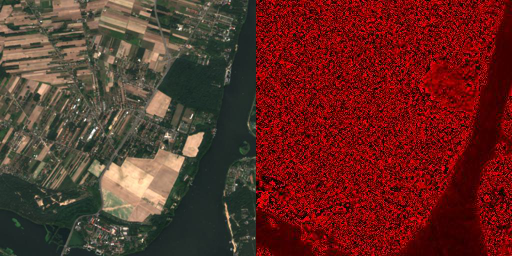

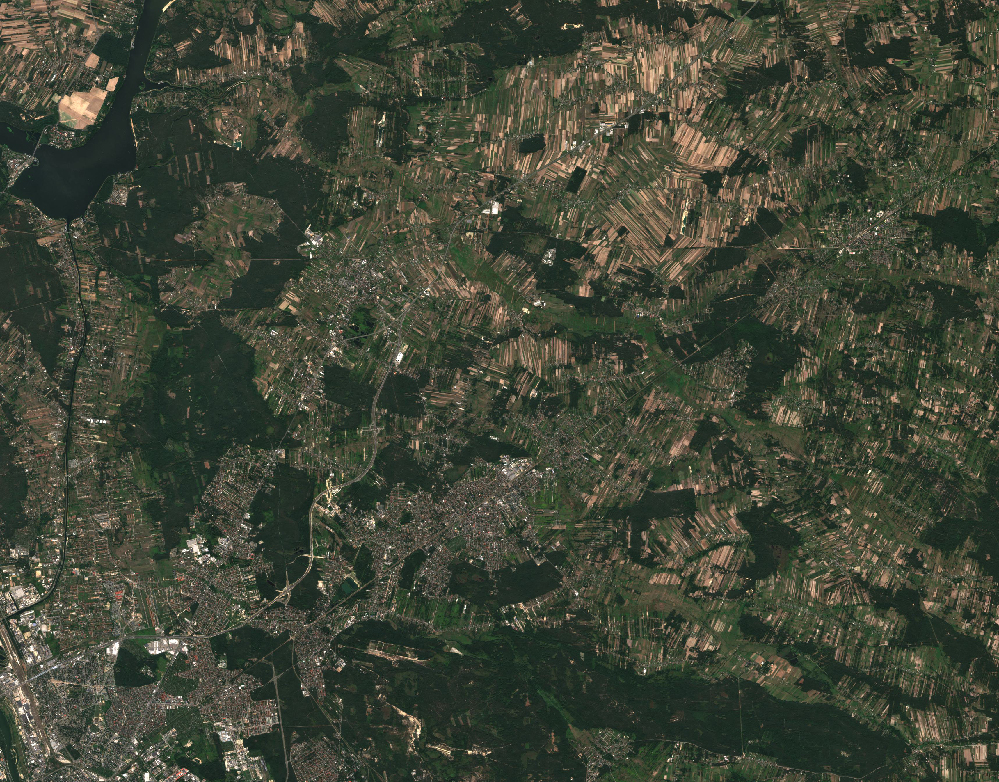